In [1]:
%load_ext autoreload
%autoreload 2
%env CUDA_VISIBLE_DEVICES 2

env: CUDA_VISIBLE_DEVICES=2


In [2]:
import sys

sys.path.insert(0, '..')
sys.path.insert(0, '../open-metric-learning')

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from torchvision import transforms

import torch
from tqdm import tqdm

from oml.datasets.base import DatasetWithLabels
from oml.losses.triplet import TripletLossWithMiner
from oml.miners.inbatch_all_tri import AllTripletsMiner
from oml.models.vit.vit import ViTExtractor
from oml.samplers.balance import BalanceSampler
from oml.utils.download_mock_dataset import download_mock_dataset
from oml.utils.images.images import imread_pillow
from oml.datasets.base import DatasetQueryGallery
from oml.metrics.embeddings import EmbeddingMetrics

from batchflow import plot, Notifier

from src.loader import ImagesDataset

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [132]:
SEED = 11
rng = np.random.default_rng(SEED)
generator = torch.Generator()
generator = generator.manual_seed(SEED)

In [5]:
DATA_PATH = '../images'
SHAPE = (128, 128)

names, inputs, labels = ImagesDataset.load(DATA_PATH)
labels, label_encoder = ImagesDataset.encode(labels)
n_classes = label_encoder.classes_.size

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/218 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/203 [00:00<?, ?it/s]

  0%|          | 0/139 [00:00<?, ?it/s]

  0%|          | 0/365 [00:00<?, ?it/s]

In [6]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(size=SHAPE),
    transforms.Normalize(mean=(0.527, 0.484, 0.423), std=(0.267, 0.258, 0.260))
])

In [7]:
df = pd.DataFrame({'path': inputs, 'label': labels})
train_df, test_df = train_test_split(df, test_size=0.2, random_state=SEED)
train_dataset = DatasetWithLabels(df=train_df, dataset_root='.', transform=transform, f_imread=imread_pillow)

In [8]:
model = ViTExtractor("vits16_dino", arch="vits16", normalise_features=False).train()
model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-6)

criterion = TripletLossWithMiner(margin=0.1, miner=AllTripletsMiner())
sampler = BalanceSampler(train_dataset.get_labels(), n_labels=2, n_instances=64)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_sampler=sampler, generator=generator)

https://dl.fbaipublicfiles.com/dino/dino_deitsmall16_pretrain/dino_deitsmall16_pretrain.pth
Checkpoint is already here.


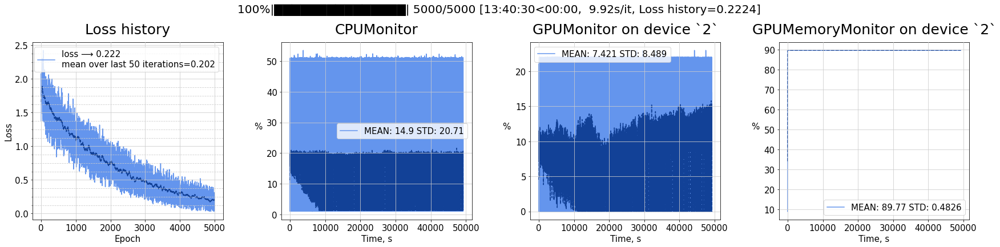

In [9]:
loss_history = []

notifier = Notifier(
    bar='n', frequency=10,
    graphs=[{'source': loss_history, 'name': 'Loss history', 'plot_config': {'xlabel': 'Epoch'}}, 'cpu', 'gpu', 'gpu_memory']
)

N_EPOCHS = 5000

for epoch_num in notifier(N_EPOCHS):
    epoch_loss = []
    for batch in train_loader:
        inputs = batch['input_tensors'].to(device)
        embeddings = model(inputs)

        labels = batch['labels'].to(device)
        loss = criterion(embeddings, labels)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        loss_value = loss.detach().cpu().numpy().flatten()[0]
        epoch_loss.append(loss_value)
    loss_history.append(np.mean(epoch_loss))

In [92]:
model = model.train(False)

In [10]:
MODEL_PATH = '../models/vit.state'
torch.save(model.state_dict(), MODEL_PATH)

In [124]:
is_gallery = np.zeros(len(df), dtype=bool)
is_gallery[train_df.index] = True

is_query = np.ones(len(df), dtype=bool)
is_query[train_df.index] = False

valid_df = df.assign(is_gallery=is_gallery, is_query=is_query)

valid_dataset = DatasetQueryGallery(df=valid_df, dataset_root='.', transform=transform, f_imread=imread_pillow)

In [125]:
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=128)
calculator = EmbeddingMetrics(extra_keys=['paths'])
calculator.setup(num_samples=len(valid_dataset))

In [126]:
with torch.no_grad():
    for batch in tqdm(valid_loader):
        inputs = batch['input_tensors'].to(device)
        batch["embeddings"] = model(inputs)
        calculator.update_data(batch)

metrics = calculator.compute_metrics()

100%|██████████| 12/12 [00:04<00:00,  2.59it/s]


Metrics:
{'OVERALL': {'cmc': {5: tensor(0.9544)},
             'map': {5: tensor(0.7649)},
             'precision': {5: tensor(0.8042)}}}


Q   ../images/Naturalism/marianne-north_the-aqueduct-of-morro-velho-brazil-1873.jpg
G 0 ../images/photo/006512.jpg
G 1 ../images/photo/005429.jpg
G 2 ../images/photo/009845.jpg
Q   ../images/Cubism/jury-annenkov_portrait-of-vsevolod-meyerhold-1.jpg
G 0 ../images/Japonism/edouard-vuillard_the-avenue.jpg
G 1 ../images/Impressionism/konstantin-korovin_still-life-with-blue-vase-1922.jpg
G 2 ../images/Impressionism/alfred-sisley_view-of-montmartre-from-the-cite-des-fleurs-1869.jpg
Q   ../images/Cubism/richard-lindner_i-ii.jpg
G 0 ../images/Japonism/edouard-vuillard_the-avenue.jpg
G 1 ../images/Impressionism/konstantin-korovin_still-life-with-blue-vase-1922.jpg
G 2 ../images/Impressionism/alfred-sisley_view-of-montmartre-from-the-cite-des-fleurs-1869.jpg
Q   ../images/Cubism/johannes-sveinsson-kjarval_hvitasunnudagr-1919.jpg
G 0 ../images/Japonism/edouard-vuillard_the-avenue.jpg
G 1 ../images/Impressionism/konstantin-korovin_still-life-with-blue-vase-1922.jpg
G 2 ../images/Impressionism/alfr

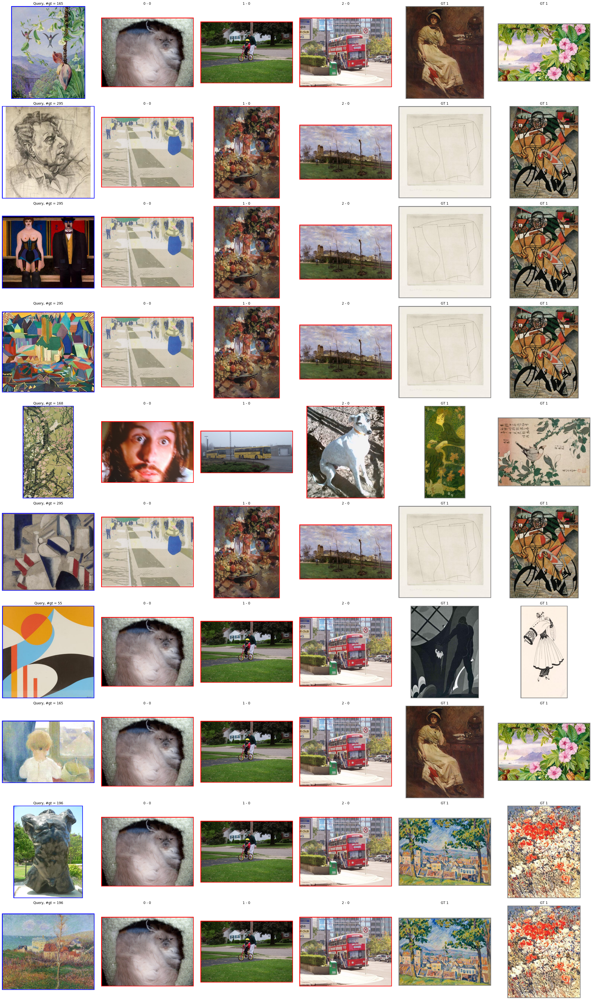

In [136]:
calculator.get_plot_for_queries(rng.integers(0, len(test_df), 10), 3);